In [1]:
! python --version

Python 3.10.7


In [4]:
conda install notebook


SyntaxError: invalid syntax (378409372.py, line 1)

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from IPython.display import HTML

ModuleNotFoundError: No module named 'pandas'

In [3]:
directory = 'NZ Data/DTU Data/data/'
entries = os.listdir(directory)
entries_new = [e.split('_')[0] for e in entries] #without extension and so on.
# Define a color palette for different sheets

sheet_colors = {
    'Kokpanna1': 'tab:blue',
    'Kokpanna2': 'tab:red',
    'Kokpanna4': 'tab:green',
    'Kokpanna5': 'k',  # Black
}

sheet_names=[]
counter=0

data_dict = {}
for e, path in tqdm(zip(entries_new, entries), desc='Data files read'):
    data_dict[e] = pd.read_excel(os.path.join(directory, path))
    # Clean data by replacing "(null)" with NaN
    data_dict[e] = data_dict[e].replace("(null)", float("NaN"))

    # Convert the 'Time' column to datetime
    data_dict[e]['Time'] = pd.to_datetime(data_dict[e]['Time'], format='%d-%m-%Y %H:%M')

    # Create subplots for each column
    
    sns.set_style('whitegrid')
    #color= sheet_colors[sheet]


Data files read: 4it [00:49, 12.41s/it]


In [4]:
columns = data_dict[entries_new[0]].keys()
columns_to_plot = columns[1:]
colors = ['tab:blue', 'tab:red', 'tab:green', 'k']

In [5]:
data_list = [data_dict[e] for e in entries_new]

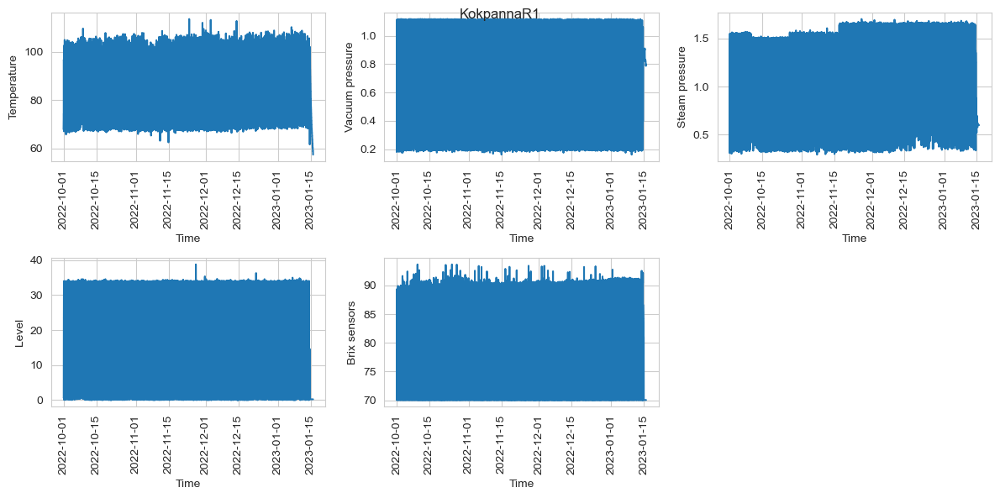

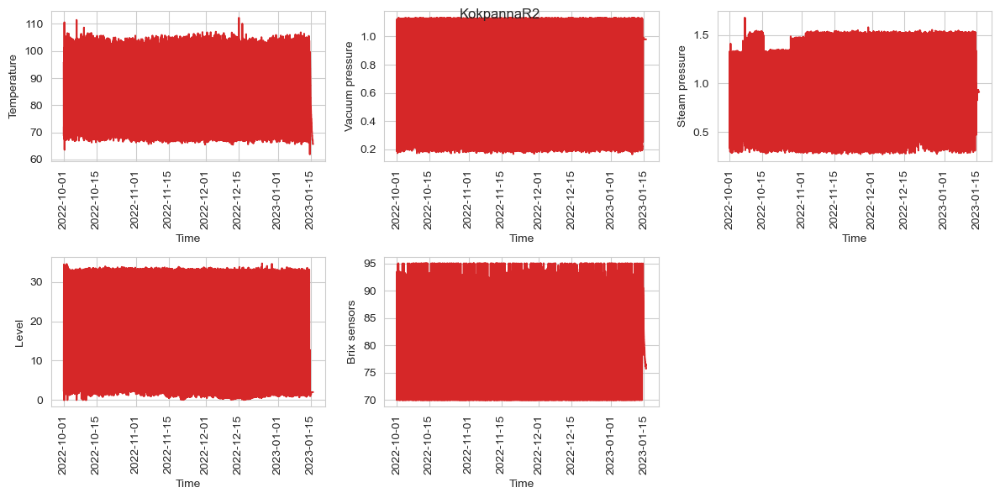

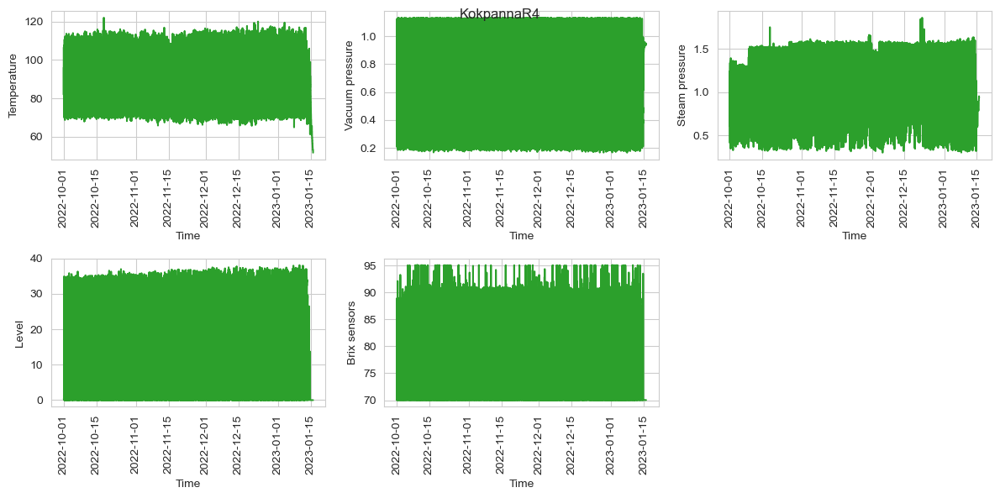

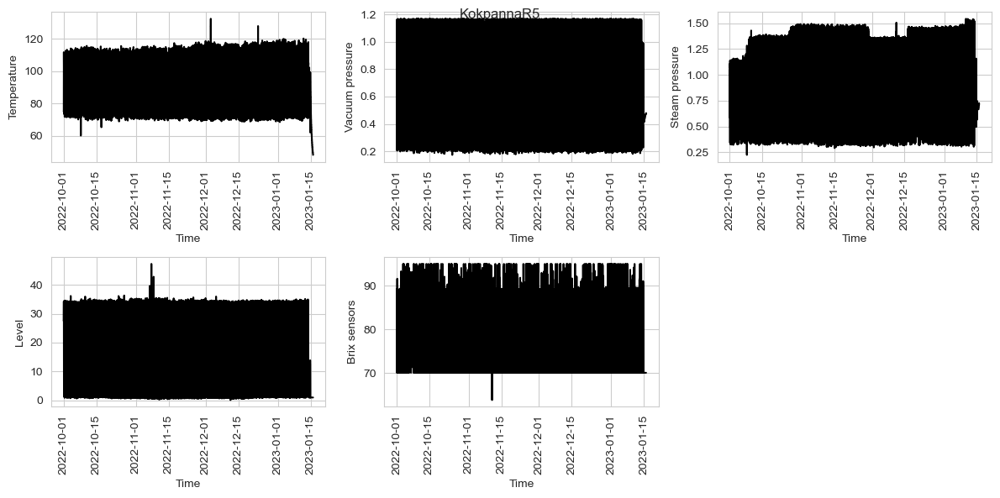

In [10]:
for index, e in enumerate(entries_new):
    plt.figure(figsize=(12, 6))
    for c, col in enumerate(columns_to_plot):
        plt.subplot(2, 3, c+1)
        plt.plot(data_list[index]['Time'], data_list[index][col], color=colors[index])
        plt.xticks(rotation=90)
        plt.xlabel('Time')
        plt.ylabel(col)
    plt.tight_layout()
        
    plt.suptitle(e)

In [6]:
# Assuming data_list is your list of DataFrames
# Initialize an empty dictionary to store the OWP DataFrames for each tank
OWP = {}

# Iterate over each DataFrame in data_list
for index, df in enumerate(data_list):
    # Filter rows based on pressure between 0.15 and 0.35
    owp_df = df[(df['Vacuum pressure'] >= 0.15) & (df['Vacuum pressure'] <= 0.35)]
    
    # Store the filtered DataFrame in the dictionary with the tank index as the key
    OWP[index] = owp_df

In [7]:
import datetime

start_time = datetime.datetime(2022, 10, 1)
end_time = datetime.datetime(2023, 1, 15)

OWPT = OWP[3].loc[(OWP[3]['Time'] >= start_time) & (OWP[3]['Time'] <= end_time)]

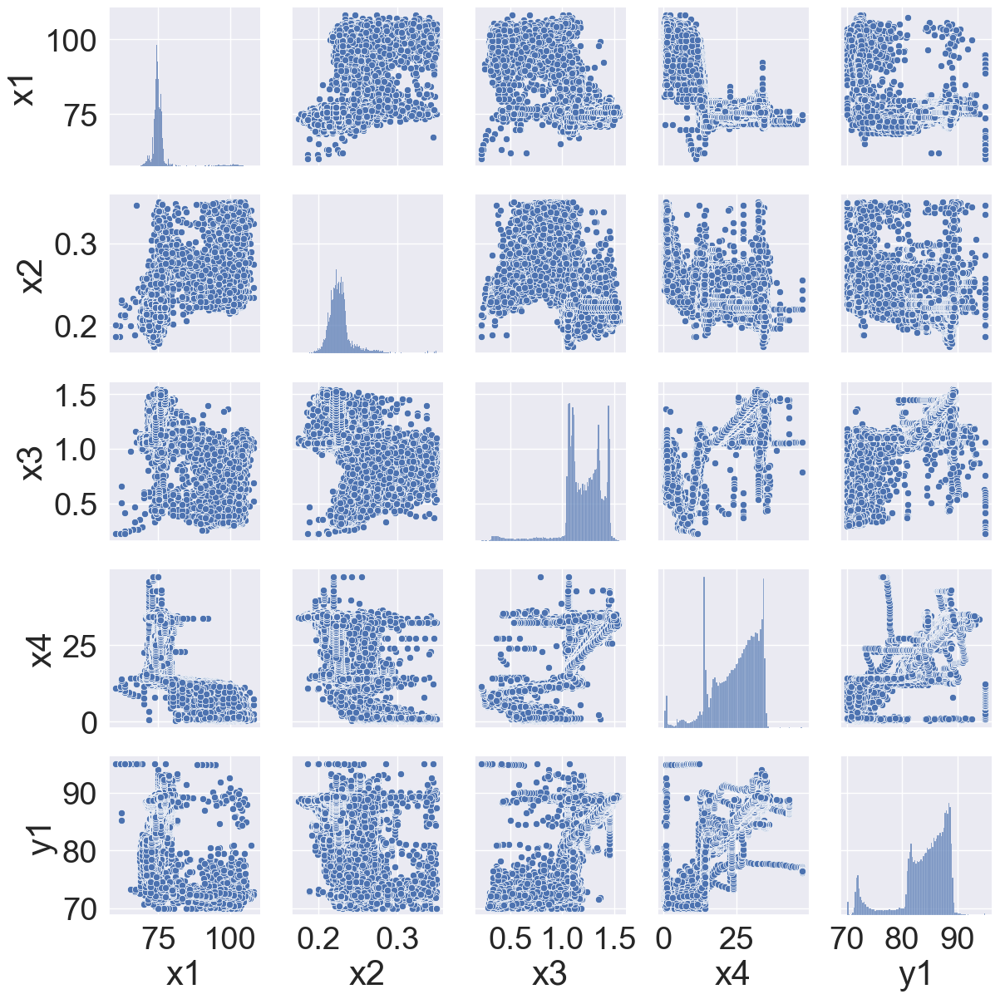

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the size and font scale
sns.set(rc={'figure.figsize': (12, 8)})
sns.set(font_scale=2.5)

# Create the pairplot
plot = sns.pairplot(OWPT)

# Set custom labels for the axes
plot.axes[0, 0].set_ylabel('x1')
plot.axes[1, 0].set_ylabel('x2')
plot.axes[2, 0].set_ylabel('x3')
plot.axes[3, 0].set_ylabel('x4')
plot.axes[4, 0].set_ylabel('y1')

# Set custom labels for x-axes
plot.axes[4, 0].set_xlabel('x1')
plot.axes[4, 1].set_xlabel('x2')
plot.axes[4, 2].set_xlabel('x3')
plot.axes[4, 3].set_xlabel('x4')
plot.axes[4, 4].set_xlabel('y1')

# Show the plot
plt.show()


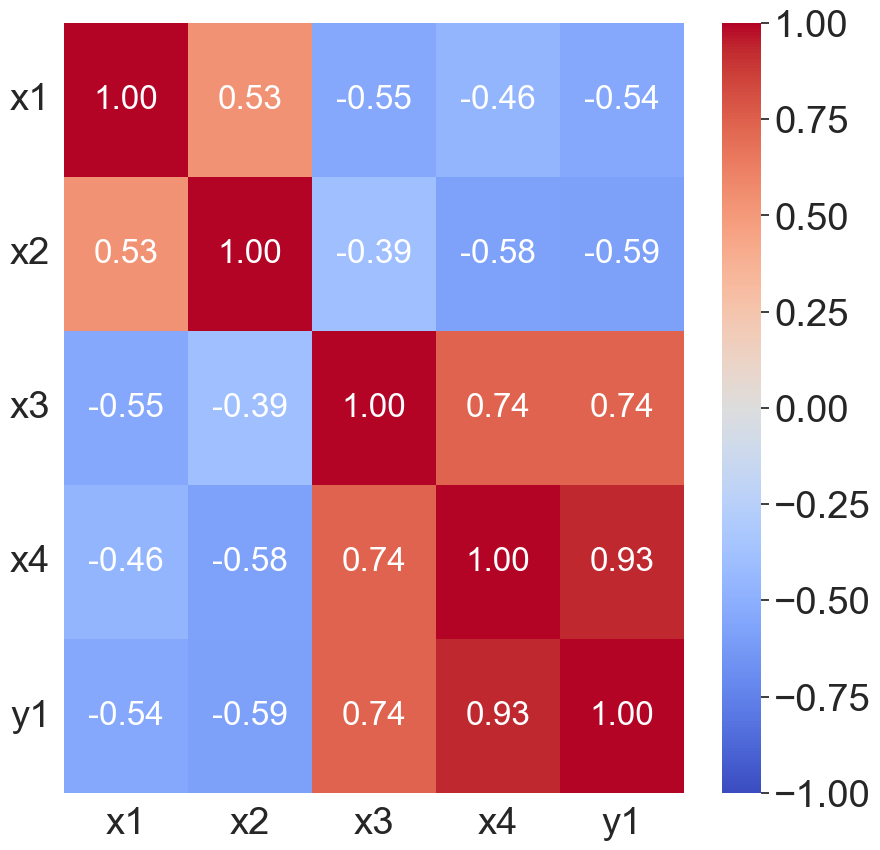

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Excluding 'Time' column
columns_to_exclude = ['Time']

# Filter the dataframe to exclude the specified columns
filtered_OWPT = OWPT.drop(columns=columns_to_exclude, errors='ignore')

# Calculate the correlation matrix for the filtered dataframe
CM_OWPT = filtered_OWPT.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 10))
heatmap = sns.heatmap(CM_OWPT, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 24,"color": "white"})

# Set custom labels for both x-axis and y-axis
new_labels = ['x1', 'x2', 'x3', 'x4', 'y1']
heatmap.set_xticklabels(new_labels, rotation=0)
heatmap.set_yticklabels(new_labels)

# Set font scale
sns.set(font_scale=2.5)

plt.show()


In [8]:
OWPT= OWPT.reset_index()

In [9]:
#BDP: Batch Data Base Pressure
Bench = OWPT['Time'].diff()
batch_change_indices = OWPT.index[Bench > pd.Timedelta(minutes=1)]
BDP = []
start_idx = 0
for idx in batch_change_indices:
    BDP.append(OWPT.iloc[start_idx:idx])
    start_idx = idx
BDP.append(OWPT.iloc[start_idx:])

In [10]:
#OWPTB: Operating Window Pressure Based Time Frame with Batch number
OWPTB = pd.concat(BDP, ignore_index=True)

for i, df in enumerate(BDP):
    BDP[i] = df.copy()
    BDP[i].loc[:, 'Batch'] = i

OWPTB = pd.concat(BDP, ignore_index=True)

# MLR

RSE: 0.29
MSE: 0.08
R^2: 0.94
MAE: 0.19


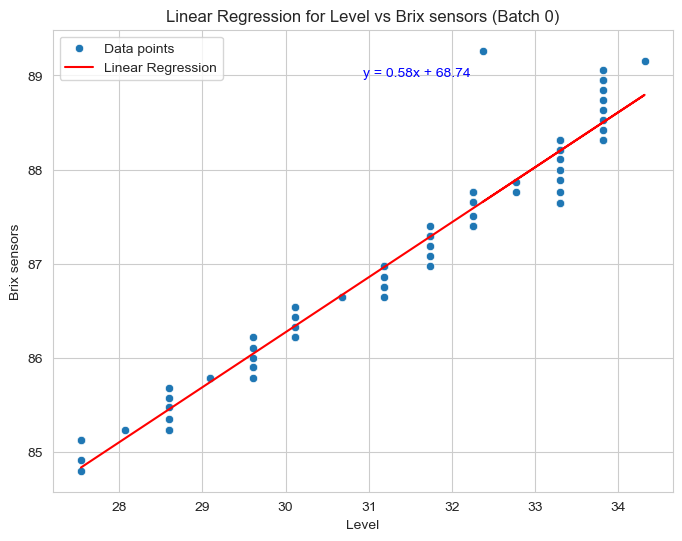

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Filter data for Batch=0
batch_data = OWPTB[OWPTB['Batch'] == 0]

# Extract 'Level' and 'Brix sensors' columns
level_data = batch_data['Level']
brix_data = batch_data['Brix sensors']

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(level_data, brix_data)

# Plot the data points and regression line
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Level', y='Brix sensors', data=batch_data, label='Data points')
plt.plot(level_data, slope * level_data + intercept, color='red', label='Linear Regression')

# Set labels and title
plt.xlabel('Level')
plt.ylabel('Brix sensors')
plt.title('Linear Regression for Level vs Brix sensors (Batch 0)')

# Display the regression equation
equation = f'y = {slope:.2f}x + {intercept:.2f}'
plt.text(0.5, 0.9, equation, transform=plt.gca().transAxes, fontsize=10, color='blue')


# Predict Brix sensors values using the linear regression model
predicted_brix = slope * level_data + intercept

# Calculate RSE
rse = np.sqrt(sum((brix_data - predicted_brix) ** 2) / (len(brix_data) - 2))

# Calculate MSE
mse = mean_squared_error(brix_data, predicted_brix)

# Calculate R^2
r2 = r2_score(brix_data, predicted_brix)

# Calculate MAE
mae = mean_absolute_error(brix_data, predicted_brix)

# Display the results
print(f"RSE: {rse:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R^2: {r2:.2f}")
print(f"MAE: {mae:.2f}")



# Show the legend
plt.legend()

# Show the plot
plt.show()


Validation MAPE: 1.25%
Validation MSE: 2.83
Validation R^2: 0.87
Validation MAE: 1.01


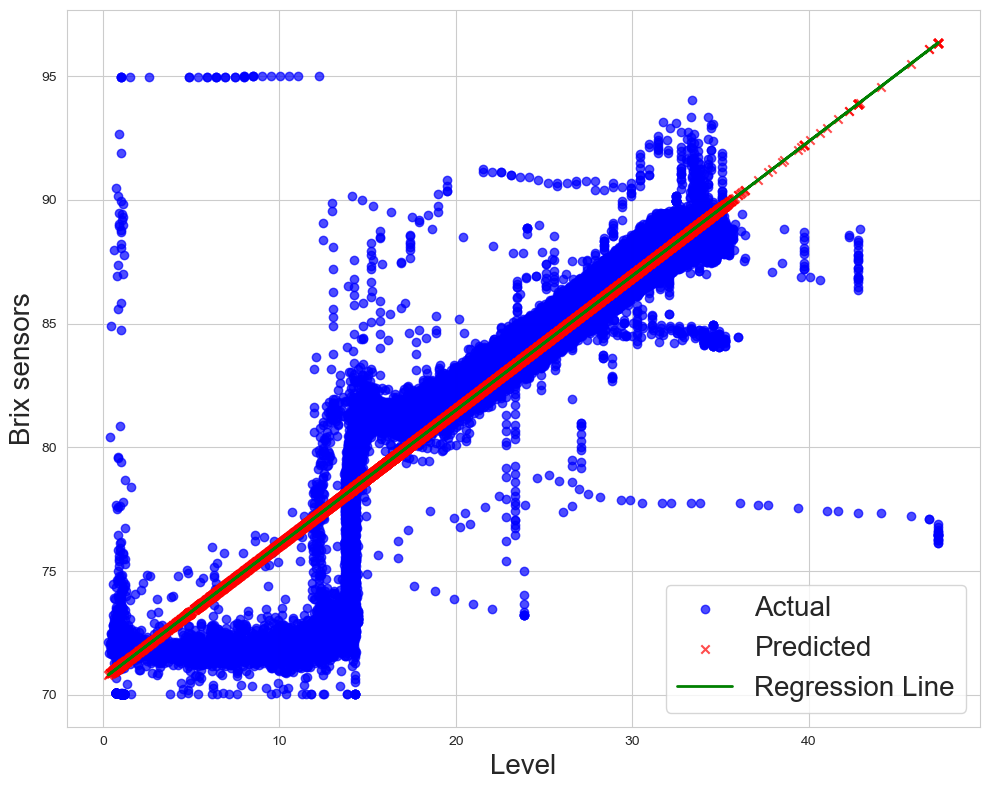

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.stats import linregress
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variable) and target (dependent variable)
X = OWPTB[['Level']]
y = OWPTB['Brix sensors']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.6, random_state=42)

# Perform linear regression on the training set
slope, intercept, _, _, _ = linregress(X_train['Level'], y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = slope * X_val['Level'] + intercept

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

# Plot actual vs predicted values on the validation set
plt.figure(figsize=(10, 8))

# Plot actual values
plt.scatter(X_val['Level'], y_val, label='Actual', marker='o', color='blue', alpha=0.7)

# Plot predicted values
plt.scatter(X_val['Level'], predicted_brix_val, label='Predicted', marker='x', color='red', alpha=0.7)

# Plot regression line
plt.plot(X_val['Level'], slope * X_val['Level'] + intercept, color='green', linewidth=2, label='Regression Line')

plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20)
plt.grid(True)
plt.tight_layout()

# Save the plot as an image
plt.savefig('linear_regression_plot.png')

# Show the plot
plt.show()


# MLR Basic Model

Validation MAPE: 1.19%
Validation MSE: 2.74
Validation R^2: 0.87
Validation MAE: 0.96


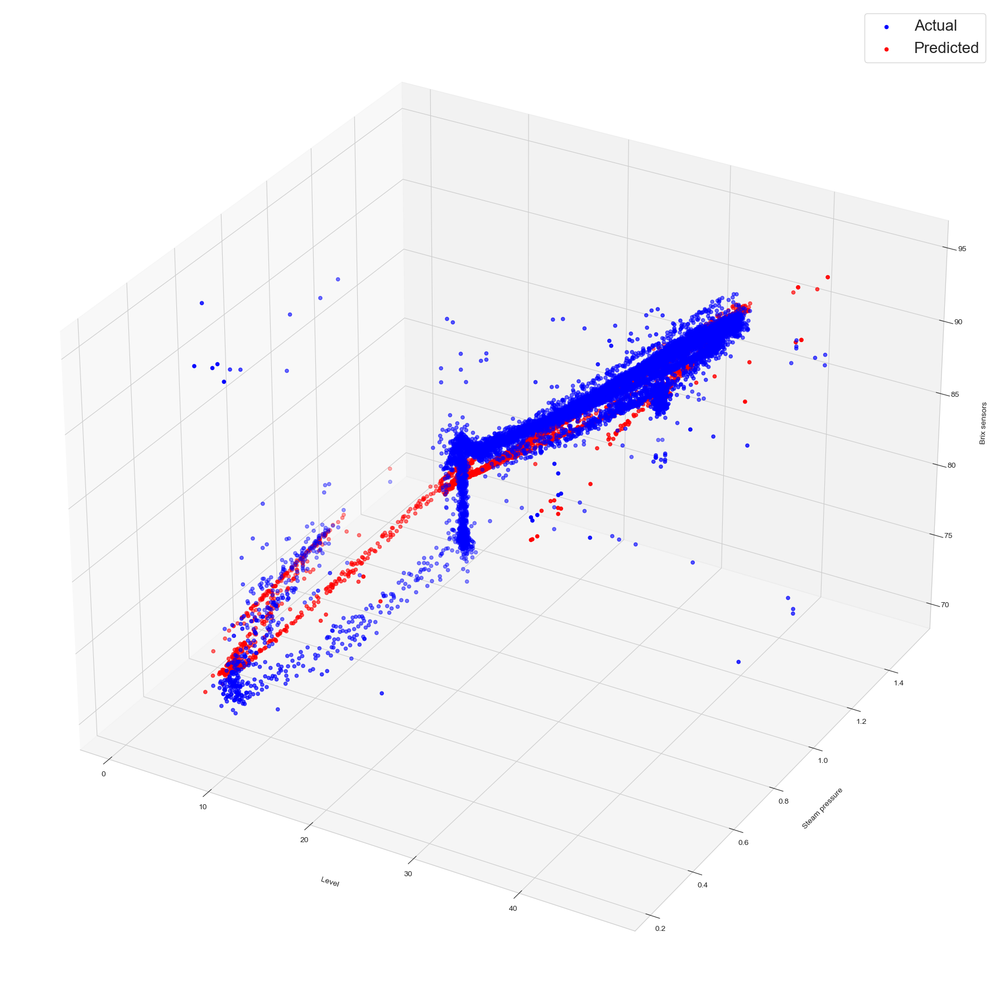

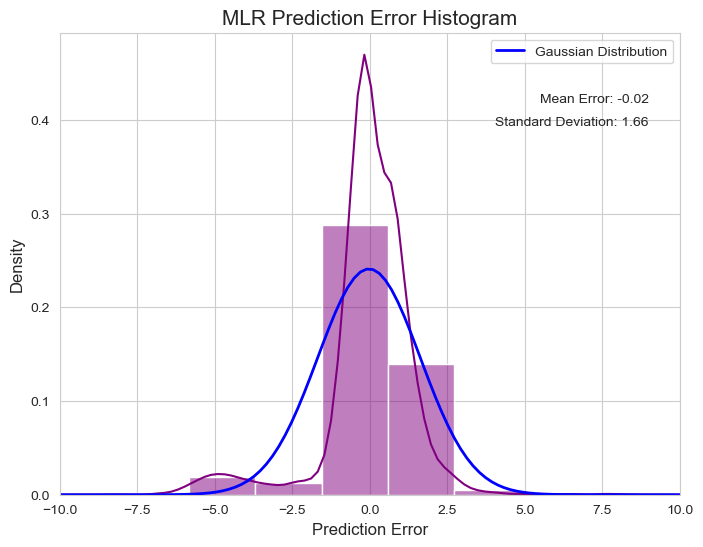

In [19]:
#MLR based on level and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



# MLR Model 1

Validation MAPE: 1.18%
Validation MSE: 2.64
Validation R^2: 0.87
Validation MAE: 0.95


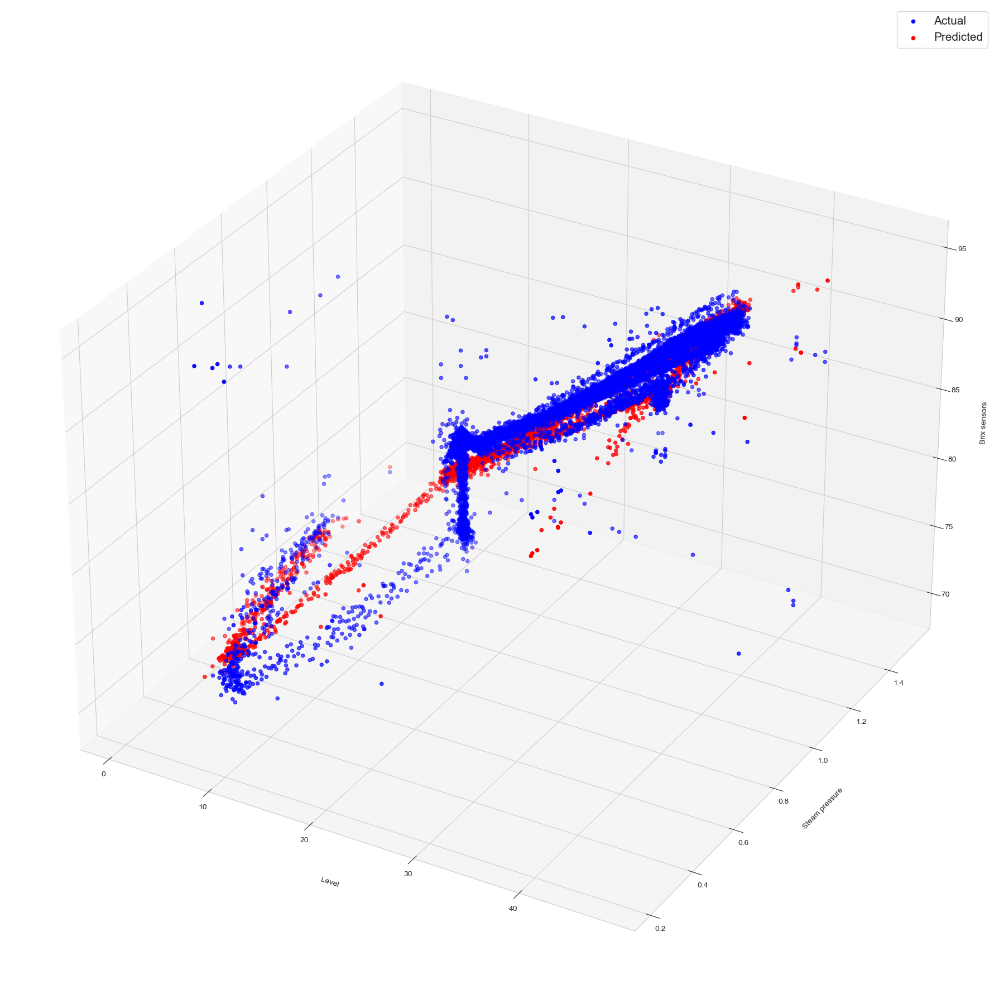

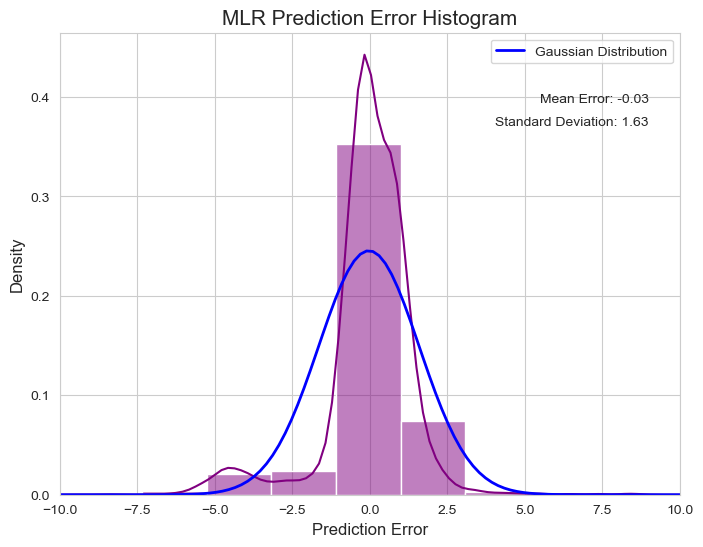

In [20]:
#MLR based on Level, vacuum pressure and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level','Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=15)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



# MLR Model 2

Validation MAPE: 2.00%
Validation MSE: 7.23
Validation R^2: 0.65
Validation MAE: 1.64


C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2931342032.py:71: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2931342032.py:72: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2931342032.py:73: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.
  ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2931342032.py:74: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yax

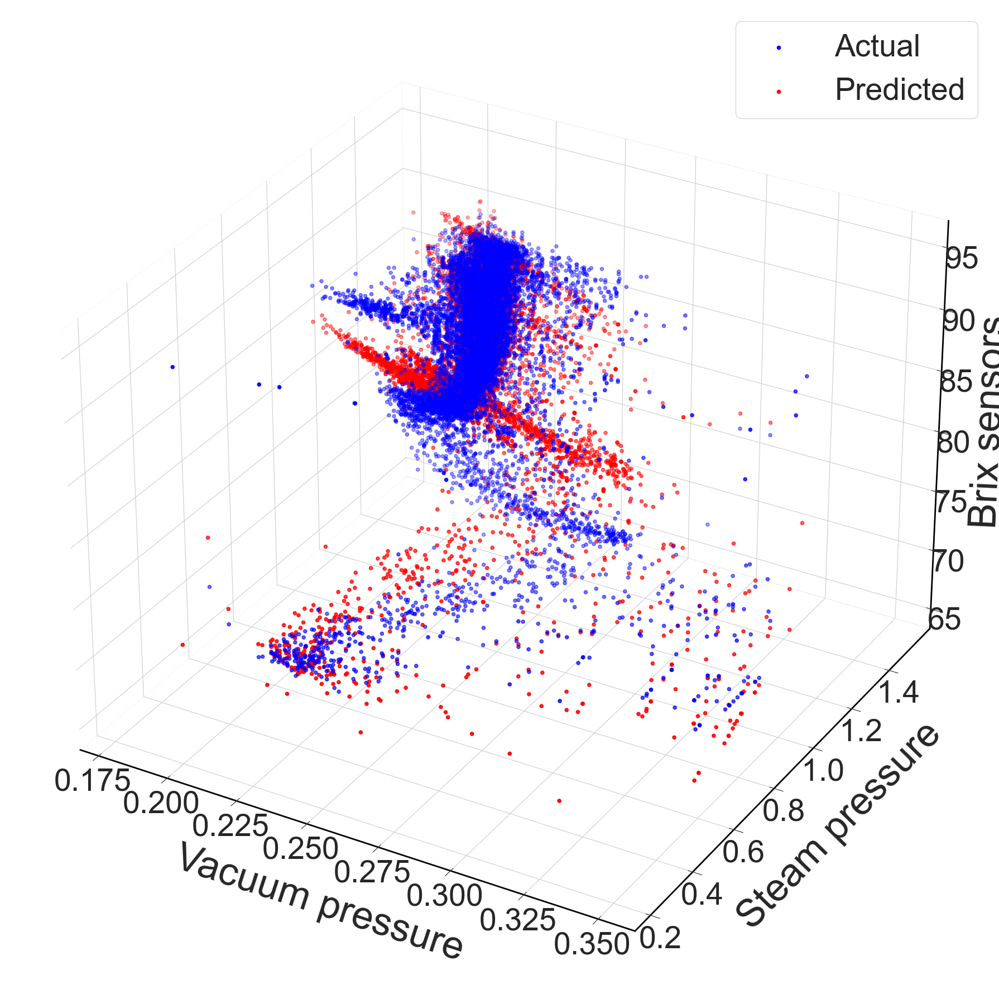

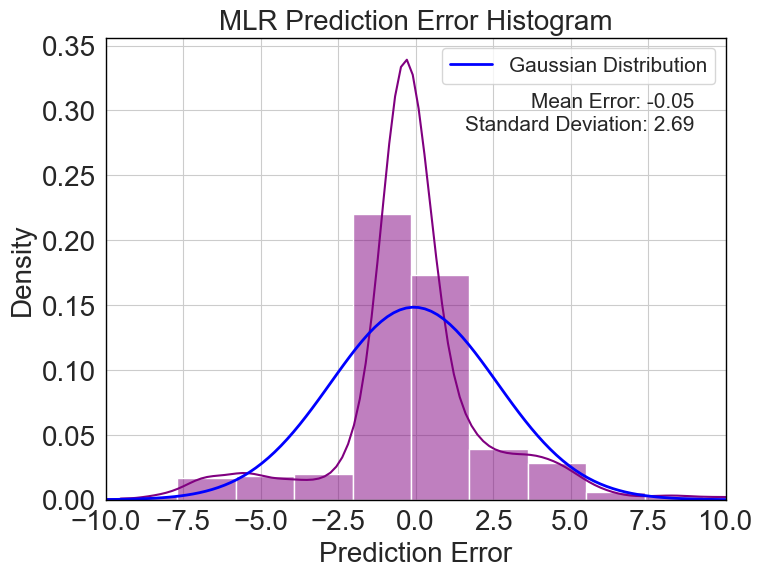

In [78]:
#MLR based on vacuum pressure and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Vacuum pressure'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Vacuum pressure'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=40,fontsize=50)
ax.set_ylabel('Steam pressure',labelpad=40,fontsize=50)
ax.set_zlabel('Brix sensors',labelpad=20,fontsize=50)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=40)
ax.tick_params(axis='y', labelsize=40)
ax.tick_params(axis='z', labelsize=40)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Turn on the grid
ax.grid(True, linestyle='--', color='black', linewidth=4)
ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
ax.w_yaxis.line.set_color('black')  # Set color for y-axis grid lines

ax.w_zaxis.line.set_lw(2)  # Set line width for z-axis grid lines
ax.w_zaxis.line.set_color('black')  # Set color for z-axis grid lines

# Show the plot
plt.legend(fontsize=40)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=20)
plt.xlabel('Prediction Error', fontsize=20)
plt.ylabel('Density', fontsize=20)
plt.grid(True)
plt.legend(fontsize=15)

# Set the font of the numbers on the axes
plt.xticks(fontsize=20)  # Change font and size of x-axis numbers
plt.yticks(fontsize=20)  # Change font and size of y-axis numbers

# Add a black border around the plot
plt.gca().spines['top'].set_color('black')
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['right'].set_color('black')
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1)

plt.show()



                            OLS Regression Results                            
Dep. Variable:           Brix sensors   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                 1.364e+05
Date:                Wed, 28 Aug 2024   Prob (F-statistic):               0.00
Time:                        11:33:50   Log-Likelihood:            -1.0941e+05
No. Observations:               57742   AIC:                         2.188e+05
Df Residuals:                   57738   BIC:                         2.189e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              73.1404      0.121    6

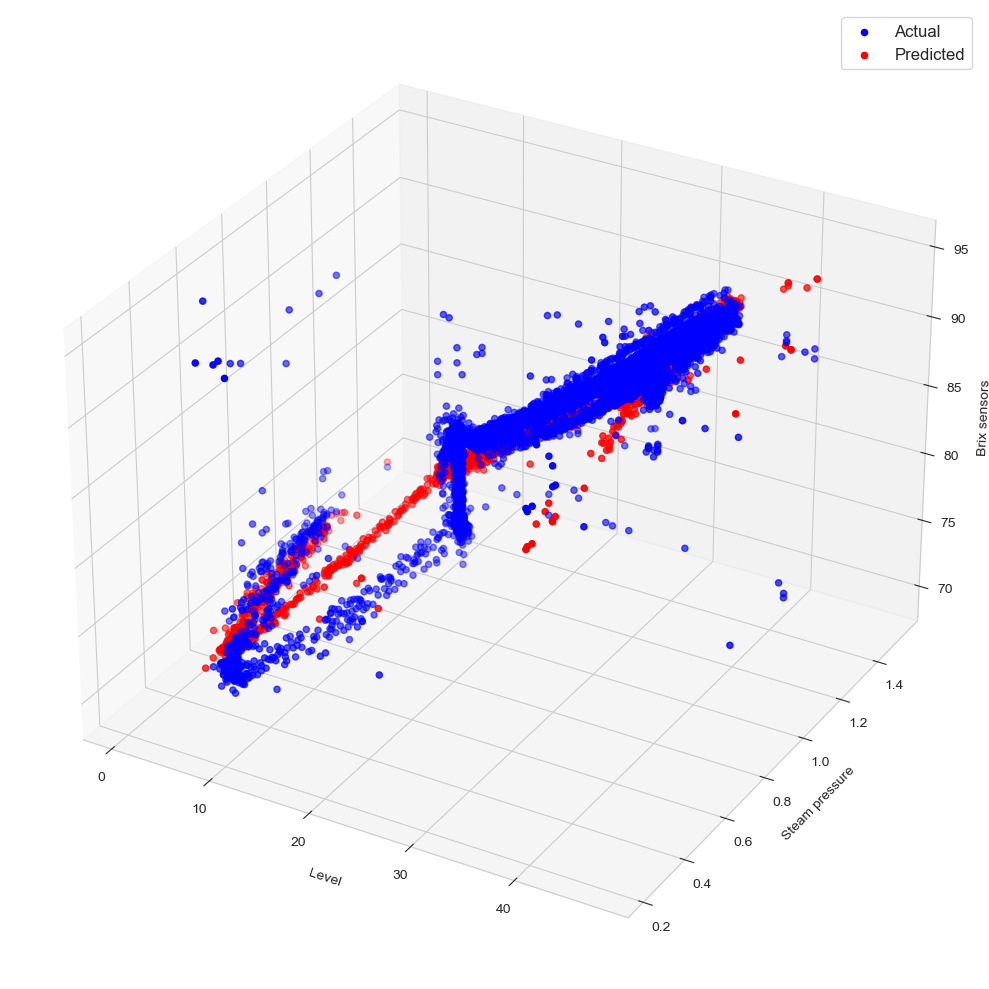

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure','Vacuum pressure']]
y = OWPTB['Brix sensors']

# Add constant for intercept
X = sm.add_constant(X)

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Fit the linear regression model
model = sm.OLS(y_train, X_train).fit()

# Get model summary
print(model.summary())

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

# Get the confidence intervals for the coefficients
conf_int = model.conf_int()

# Calculate the prediction interval manually based on residuals
residuals = y_val - predicted_brix_val
std_err = np.sqrt(np.sum(residuals ** 2) / (len(X_val) - 2))
t_value = 1.96  # 95% confidence interval
pred_interval = t_value * std_err

# Display confidence intervals and prediction interval
print("\nConfidence Intervals for Coefficients:")
print(conf_int)
print(f"\nPrediction Interval: ±{pred_interval:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level', labelpad=5)
ax.set_ylabel('Steam pressure', labelpad=5)
ax.set_zlabel('Brix sensors', labelpad=5)
fig.tight_layout()

# Show the plot
plt.legend(fontsize=12)
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Add constant for intercept
X = sm.add_constant(X)

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Fit the linear regression model
model = sm.OLS(y_train, X_train).fit()

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate the prediction interval
residuals = y_val - predicted_brix_val
std_err = np.sqrt(np.sum(residuals ** 2) / (len(X_val) - 2))
t_value = 1.96  # 95% confidence interval
pred_interval = t_value * std_err

# Plotting Brix sensors vs Level with prediction interval
plt.figure(figsize=(10, 8))

# Scatter plot for actual Brix sensors
plt.scatter(X_val['Level'], y_val, color='blue', label='Actual', alpha=0.6)

# Scatter plot for predicted Brix sensors
plt.scatter(X_val['Level'], predicted_brix_val, color='red', label='Predicted', alpha=0.6)

# Plot prediction interval
plt.fill_between(X_val['Level'], predicted_brix_val - pred_interval, predicted_brix_val + pred_interval, color='orange', alpha=0.3, label='Prediction Interval')

# Add labels and title
plt.xlabel('Level')
plt.ylabel('Brix sensors')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


# NN Basic Model

In [ ]:
## Multivariate Optimized NN based on Steam pressure and Level
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=2, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Level' and 'Steam pressure' are your input features
level = X_test['Level']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(level, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(level, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



# NN Model 1

In [ ]:
## Multivariate Optimized NN based on Level, Steam pressure and Vacuum pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Level', 'Vacuum pressure','Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=3, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Level' and 'Steam pressure' are your input features
level = X_test['Level']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(level, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(level, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



# NN Model 2

In [68]:
## Multivariate Optimized NN based on Vaccum pressure and Steam pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=2, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Vacuum pressure' and 'Steam pressure' are your input features
vacuum_pressure = X_test['Vacuum pressure']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred




C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


301/301 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Mean Absolute Percentage Error (MAPE): 1.56%
Mean Squared Error (MSE): 5.12
R-squared (R2): 0.75
Mean Absolute Error (MAE): 1.30


C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2274264280.py:29: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2274264280.py:30: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2274264280.py:31: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.
  ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_19368\2274264280.py:32: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yax

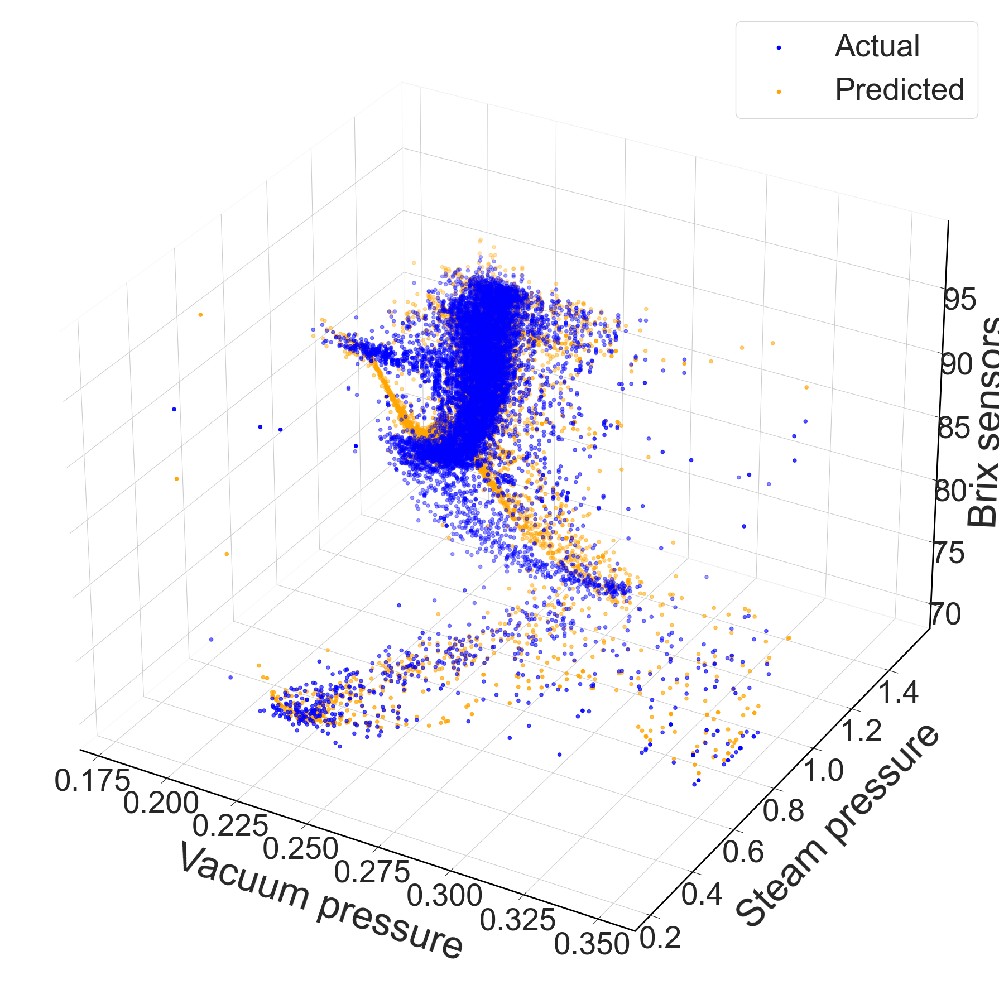

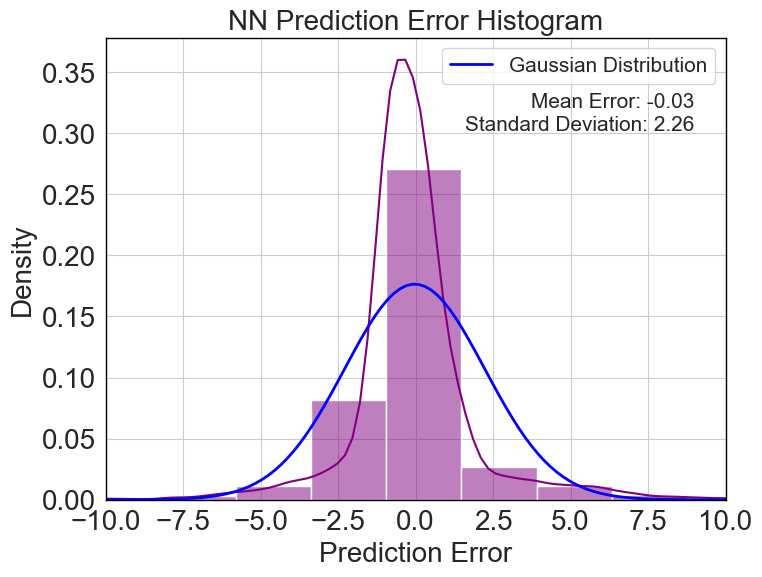

In [72]:
# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(vacuum_pressure, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(vacuum_pressure, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=40,fontsize=50)
ax.set_ylabel('Steam pressure',labelpad=40,fontsize=50)
ax.set_zlabel('Brix sensors',labelpad=20,fontsize=50)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=40)
ax.tick_params(axis='y', labelsize=40)
ax.tick_params(axis='z', labelsize=40)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Turn on the grid
ax.grid(True, linestyle='--', color='black', linewidth=4)
ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
ax.w_yaxis.line.set_color('black')  # Set color for y-axis grid lines

ax.w_zaxis.line.set_lw(2)  # Set line width for z-axis grid lines
ax.w_zaxis.line.set_color('black')  # Set color for z-axis grid lines


# Show the plot
plt.legend(fontsize=40)
plt.show()

# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=20)
plt.xlabel('Prediction Error', fontsize=20)
plt.ylabel('Density', fontsize=20)
plt.grid(True)
plt.legend(fontsize=15)

# Set the font of the numbers on the axes
plt.xticks(fontsize=20)  # Change font and size of x-axis numbers
plt.yticks(fontsize=20)  # Change font and size of y-axis numbers

# Add a black border around the plot
plt.gca().spines['top'].set_color('black')
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['right'].set_color('black')
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1)

plt.show()




# SVR

In [ ]:
## SVM regressioner
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level'

# Extract relevant data
data = OWPTB[['Level', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='linear')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")




# Plot actual vs predicted values
plt.figure(figsize=(10, 8))
plt.scatter(X_test['Level'], y_test,color='blue', label='Actual')
plt.scatter(X_test['Level'], y_pred, label='Predicted',color='purple', marker='o')
plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20,loc='lower right')

# Show the plots
plt.tight_layout()
plt.show()




# SVR Basic Model

In [ ]:
#SVR based on level and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm


# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Steam pressure', 'Brix sensors']]


# Split the data into features (X) and target variable (y)
X = data[['Level', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")



# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='Purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',fontsize=20)
ax.set_ylabel('Steam pressure',fontsize=20)
ax.set_zlabel('Brix sensors',fontsize=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

# SVR Model 1

In [ ]:
#SVR based on level, Vacuum pressure, steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm


# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level', 'Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")



# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='Purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)



# Show the plot
plt.legend(fontsize=20)
plt.show()


# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

# SVR Model 2

Mean Absolute Percentage Error (MAPE): 1.54%
Mean Squared Error (MSE): 6.18
R-squared (R2): 0.70
Mean Absolute Error (MAE): 1.28


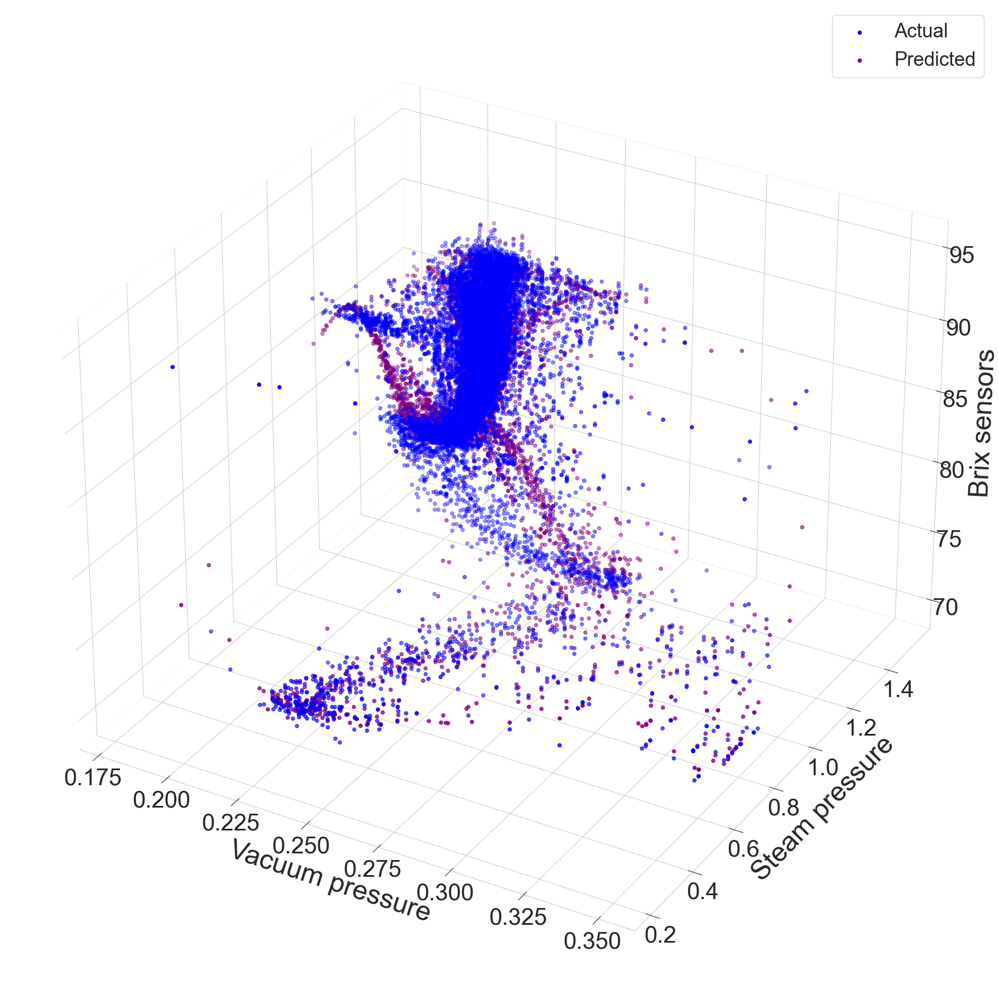

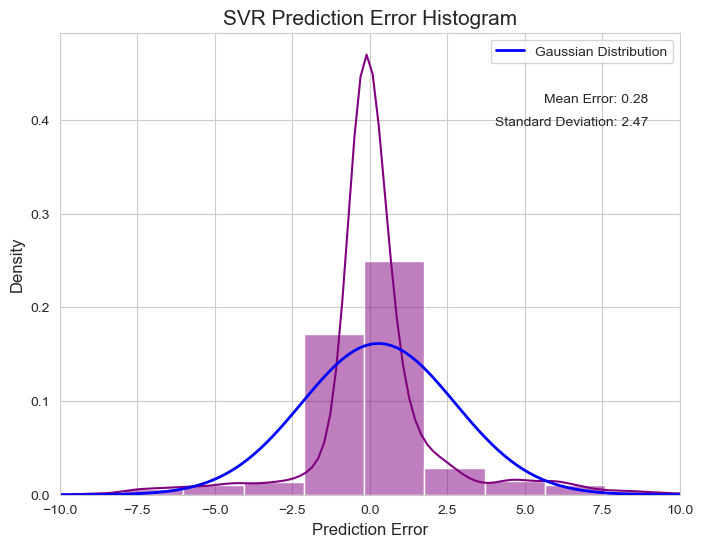

In [11]:
# SVR based on Vacuum pressure and Steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize features (using StandardScaler)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor with 'rbf' kernel (radial basis function)
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot to visualize the actual vs predicted values
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_pred, c='purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure', labelpad=20, fontsize=35)
ax.set_ylabel('Steam pressure', labelpad=20, fontsize=35)
ax.set_zlabel('Brix sensors', labelpad=15, fontsize=35)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=30)
ax.tick_params(axis='y', labelsize=30)
ax.tick_params(axis='z', labelsize=30)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Show the plot with legend
plt.legend(fontsize=25)
plt.show()

# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram for error distribution
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\3283113076.py:29: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\3283113076.py:30: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\3283113076.py:31: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.
  ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\3283113076.py:32: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yax

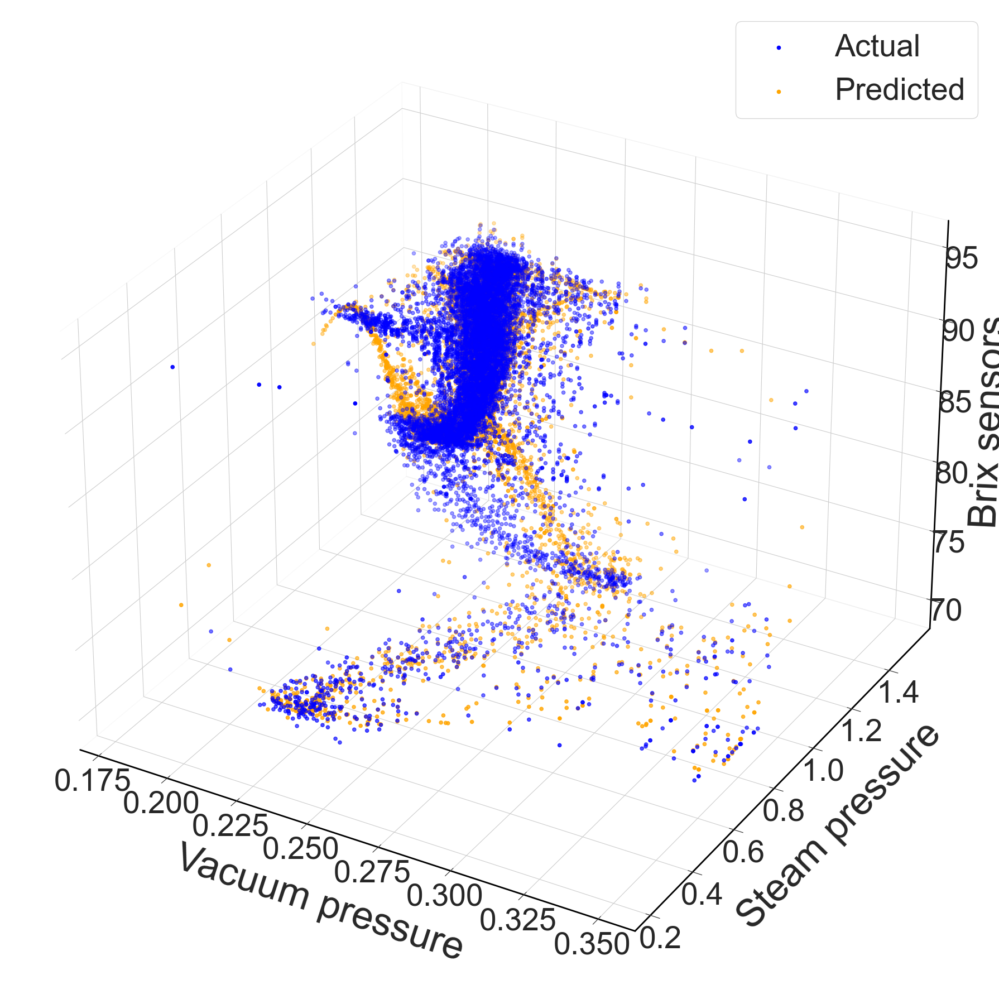

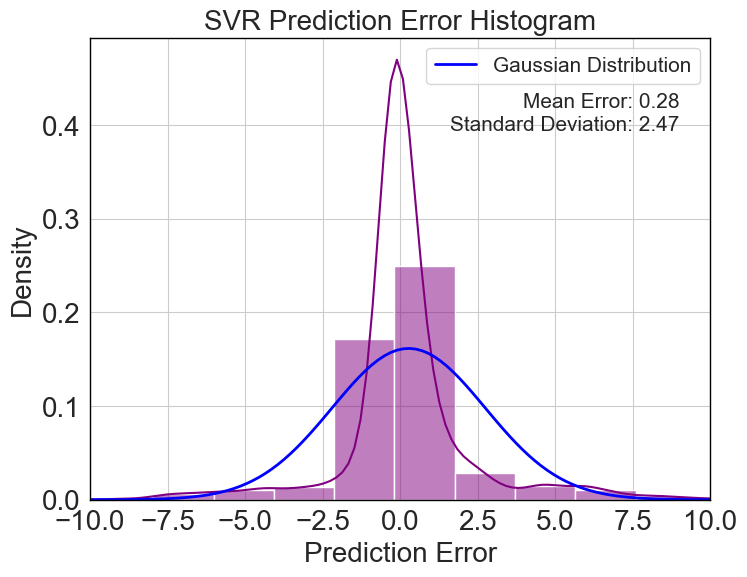

In [12]:
# Create a 3D plot to visualize the actual vs predicted values
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_pred, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure', labelpad=40, fontsize=50)
ax.set_ylabel('Steam pressure', labelpad=40, fontsize=50)
ax.set_zlabel('Brix sensors', labelpad=20, fontsize=50)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=40)
ax.tick_params(axis='y', labelsize=40)
ax.tick_params(axis='z', labelsize=40)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Turn on the grid
ax.grid(True, linestyle='--', color='black', linewidth=4)
ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
ax.w_yaxis.line.set_color('black')  # Set color for y-axis grid lines

ax.w_zaxis.line.set_lw(2)  # Set line width for z-axis grid lines
ax.w_zaxis.line.set_color('black')  # Set color for z-axis grid lines

# Show the plot with legend
plt.legend(fontsize=40)
plt.show()

# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for SVR
error_svr = y_test_array - y_pred_array

# Plotting the histogram for error distribution
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=20)
plt.xlabel('Prediction Error', fontsize=20)
plt.ylabel('Density', fontsize=20)
plt.grid(True)
plt.legend(fontsize=15)

# Set the font of the numbers on the axes
plt.xticks(fontsize=20)  # Change font and size of x-axis numbers
plt.yticks(fontsize=20)  # Change font and size of y-axis numbers

# Add a black border around the plot
plt.gca().spines['top'].set_color('black')
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['right'].set_color('black')
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1)

plt.show()

# DTR

In [ ]:
#Decision Tree regressor
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level'

# Extract relevant data
data = OWPTB[['Level', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100


# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")


# Plot actual vs predicted values
plt.figure(figsize=(10, 8))
plt.scatter(X_test['Level'], y_test, color='blue', label='Actual')
plt.scatter(X_test['Level'], y_pred, color='green', label='Predicted', marker='o')
plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20)

# Show the plots
plt.tight_layout()
plt.show()



# DTR Basic Model

In [ ]:
#DTR based on level and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()

# Calculate prediction error for DTR
error_dtr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


# DTR Model 2

Test Set - Mean Absolute Percentage Error (MAPE): 0.73%
Test Set - Mean Squared Error (MSE): 2.93
Test Set - R-squared (R2): 0.86
Test Set - Mean Absolute Error (MAE): 0.59


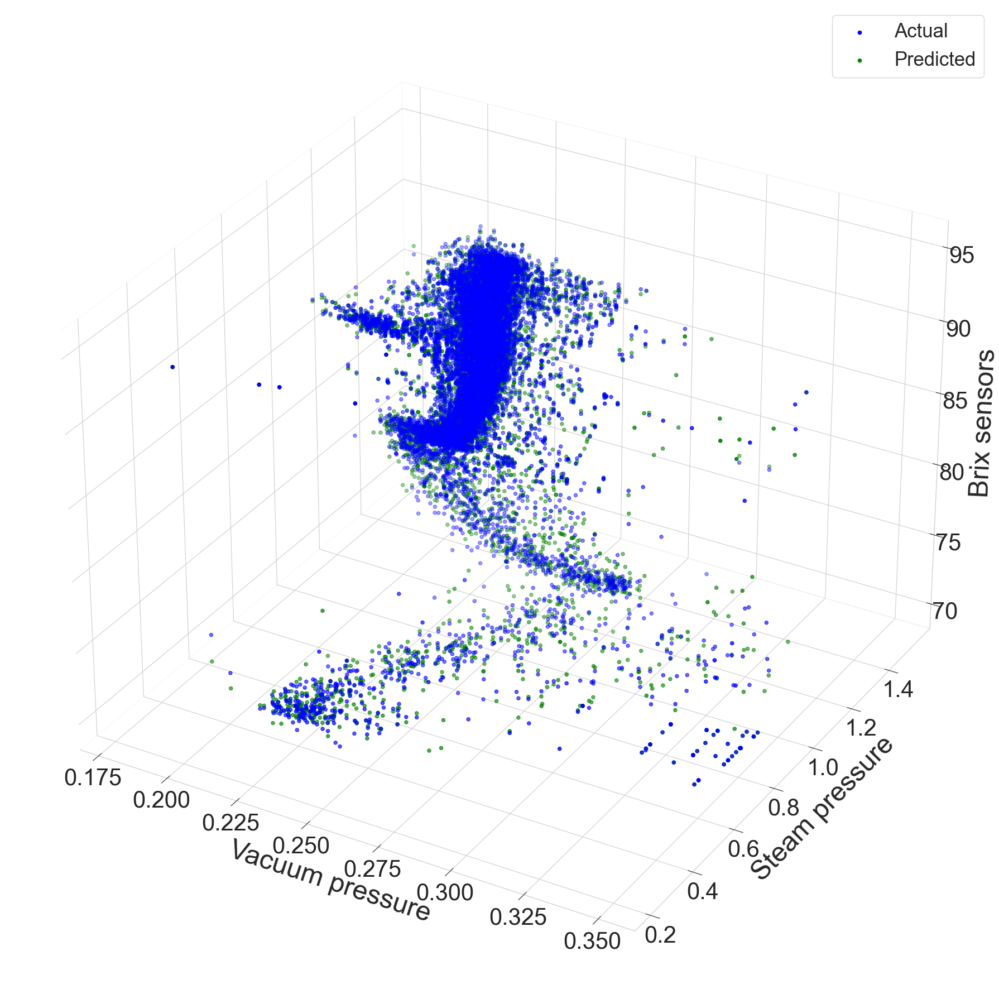

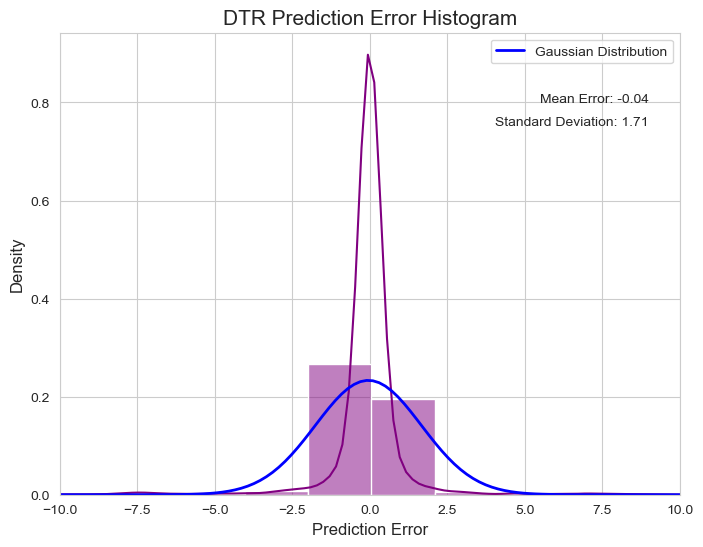

In [19]:
# DTR based on Vacuum pressure and Steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)  # 60% for training
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)  # 25% of 40% for testing (10% total)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_test_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
mape_test = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100

# Print evaluation metrics for test set
print(f'Test Set - Mean Absolute Percentage Error (MAPE): {mape_test:.2f}%')
print(f'Test Set - Mean Squared Error (MSE): {mse_test:.2f}')
print(f'Test Set - R-squared (R2): {r2_test:.2f}')
print(f'Test Set - Mean Absolute Error (MAE): {mae_test:.2f}')

# Create a 3D plot to visualize actual vs predicted Brix sensor values on the test set
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for predicted Brix sensors (Green - plotted first)
predicted_plot = ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test_pred, c='green', marker='o', label='Predicted')

# Scatter plot for actual Brix sensors (Blue - plotted last to appear on top)
actual_plot = ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Set labels
ax.set_xlabel('Vacuum pressure', labelpad=20, fontsize=35)
ax.set_ylabel('Steam pressure', labelpad=20, fontsize=35)
ax.set_zlabel('Brix sensors', labelpad=15, fontsize=35)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=30)
ax.tick_params(axis='y', labelsize=30)
ax.tick_params(axis='z', labelsize=30)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Customize legend order
plt.legend([actual_plot, predicted_plot], ['Actual', 'Predicted'], fontsize=25)

# Show the plot
plt.show()

# Calculate prediction error for DTR on the test set
error_dtr = y_test.to_numpy().flatten() - y_test_pred.flatten()

# Plotting the histogram for prediction error
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


Test Set - Mean Absolute Percentage Error (MAPE): 0.73%
Test Set - Mean Squared Error (MSE): 2.93
Test Set - R-squared (R2): 0.86
Test Set - Mean Absolute Error (MAE): 0.59


C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\1765758858.py:77: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\1765758858.py:78: MatplotlibDeprecationWarning: The w_xaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use xaxis instead.
  ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\1765758858.py:79: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yaxis instead.
  ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
C:\Users\morebo\AppData\Local\Temp\ipykernel_23732\1765758858.py:80: MatplotlibDeprecationWarning: The w_yaxis attribute was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use yax

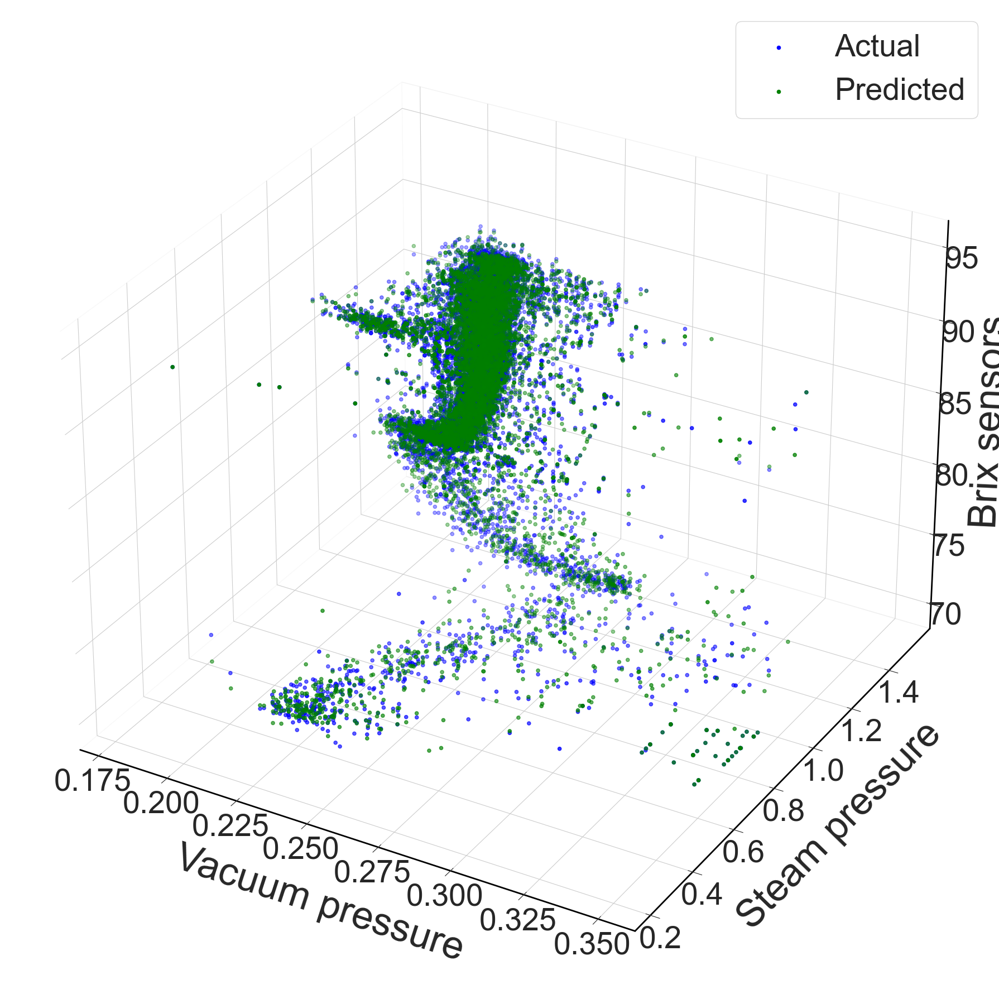

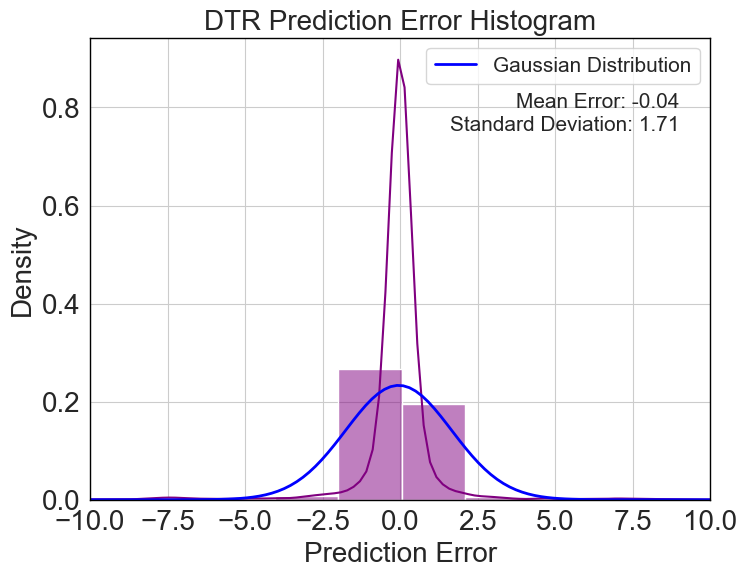

In [22]:
# DTR based on Vacuum pressure and Steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)  # 60% for training
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)  # 25% of 40% for testing (10% total)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_test_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
mape_test = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100

# Print evaluation metrics for test set
print(f'Test Set - Mean Absolute Percentage Error (MAPE): {mape_test:.2f}%')
print(f'Test Set - Mean Squared Error (MSE): {mse_test:.2f}')
print(f'Test Set - R-squared (R2): {r2_test:.2f}')
print(f'Test Set - Mean Absolute Error (MAE): {mae_test:.2f}')

# Create a 3D plot to visualize the actual vs predicted Brix sensor values on the test set
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors values
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure', labelpad=40, fontsize=50)
ax.set_ylabel('Steam pressure', labelpad=40, fontsize=50)
ax.set_zlabel('Brix sensors', labelpad=20, fontsize=50)
fig.tight_layout()

# Set tick label sizes
ax.tick_params(axis='x', labelsize=40)
ax.tick_params(axis='y', labelsize=40)
ax.tick_params(axis='z', labelsize=40)

# Remove the shaded background
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Turn on the grid
ax.grid(True, linestyle='--', color='black', linewidth=4)
ax.w_xaxis.line.set_lw(2)  # Set line width for x-axis grid lines
ax.w_xaxis.line.set_color('black')  # Set color for x-axis grid lines
ax.w_yaxis.line.set_lw(2)  # Set line width for y-axis grid lines
ax.w_yaxis.line.set_color('black')  # Set color for y-axis grid lines

ax.w_zaxis.line.set_lw(2)  # Set line width for z-axis grid lines
ax.w_zaxis.line.set_color('black')  # Set color for z-axis grid lines

# Show the plot with legend
plt.legend(fontsize=40)
plt.show()

# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_test_pred_array = y_test_pred.flatten()

# Calculate prediction error for DTR
error_dtr = y_test_array - y_test_pred_array

# Plotting the histogram for prediction error
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=15, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=20)
plt.xlabel('Prediction Error', fontsize=20)
plt.ylabel('Density', fontsize=20)
plt.grid(True)
plt.legend(fontsize=15)

# Set the font of the numbers on the axes
plt.xticks(fontsize=20)  # Change font and size of x-axis numbers
plt.yticks(fontsize=20)  # Change font and size of y-axis numbers

# Add a black border around the plot
plt.gca().spines['top'].set_color('black')
plt.gca().spines['top'].set_linewidth(1)
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['right'].set_color('black')
plt.gca().spines['right'].set_linewidth(1)
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1)

plt.show()


# DTR Model 1

In [ ]:
#DTR based on Level, vacuum pressure,and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level','Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level','Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()

# Calculate prediction error for DTR
error_dtr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()
